In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [3]:
# Function to load and preprocess an image
def preprocess_image(image_path):

  # Load an image from the given path, decode it, resize it to IMAGE_SIZE, and normalize pixel values.
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(images=image, size=[256,256])
    image = image / 255.0
    return image

In [4]:
# Function to create a data pipeline for a list of image paths
def create_dataset(low_light_images):

  # Create a TensorFlow dataset from the list of image paths.
    # The dataset will load, preprocess, and batch the images.
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images))
    dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(16, drop_remainder=True)
    return dataset

In [13]:
# Get sorted lists of image paths
train_low_light_images = sorted(glob("/content/drive/MyDrive/Train/low/*"))[31:400]
val_low_light_images = sorted(glob("/content/drive/MyDrive/Train/low/*"))[400:]
test_low_light_images = sorted(glob("/content/drive/MyDrive/Train/low/*"))
high_light_images = sorted(glob("/content/drive/MyDrive/Train/high/*"))

# Create datasets for training and validation
train_dataset = create_dataset(train_low_light_images)
val_dataset = create_dataset(val_low_light_images)

# Print dataset details
print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)

Train Dataset: <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>
Validation Dataset: <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>


In [14]:
# Function to build the Deep Curve Estimation (DCE) Network
def build_image_enhancement_net():

  # Input layer
    input_image = keras.Input(shape=[None, None, 3])

    # Convolutional layers
    conv_layer1 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(input_image)
    conv_layer2 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv_layer1)
    conv_layer3 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv_layer2)
    conv_layer4 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv_layer3)

    # Intermediate concatenation 1
    intermediate_concate1 = layers.Concatenate(axis=-1)([conv_layer4, conv_layer3])

    # Convolutional layer after intermediate concatenation 1
    conv_layer5 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(intermediate_concate1)

    # Intermediate concatenation 2
    intermediate_concate2 = layers.Concatenate(axis=-1)([conv_layer5, conv_layer2])

    # Convolutional layer after intermediate concatenation 2
    conv_layer6 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(intermediate_concate2)

    # Intermediate concatenation 3
    intermediate_concate3 = layers.Concatenate(axis=-1)([conv_layer6, conv_layer1])

    # Output layer with tanh activation
    output_layer = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(intermediate_concate3)
    return keras.Model(inputs=input_image, outputs=output_layer)

In [15]:
# Function to calculate color constancy loss
def color_constancy_loss(x):

    # Calculate mean RGB values
    mean_rgb = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
    mean_r, mean_g, mean_b = mean_rgb[:, :, :, 0], mean_rgb[:, :, :, 1], mean_rgb[:, :, :, 2]

    # Calculate squared differences
    d_rg = tf.square(mean_r - mean_g)
    d_rb = tf.square(mean_r - mean_b)
    d_gb = tf.square(mean_b - mean_g)

    # Calculate color constancy loss as the square root of the sum of squared differences
    color_constancy_loss = tf.sqrt(tf.square(d_rg) + tf.square(d_rb) + tf.square(d_gb))

    return color_constancy_loss

In [16]:
# Function to calculate exposure loss
def exposure_loss(image_tensor, target_mean=0.6):

    # Calculate mean intensity
    mean_intensity = tf.reduce_mean(image_tensor, axis=3, keepdims=True)

    # Average pooling to compute overall mean
    pooled_mean = tf.nn.avg_pool2d(mean_intensity, ksize=16, strides=16, padding="VALID")

    # Calculate exposure loss as the mean squared difference from target_mean
    exposure_loss = tf.reduce_mean(tf.square(pooled_mean - target_mean))

    return exposure_loss

In [17]:
# Function to calculate illumination smoothness loss
def illumination_smoothness_loss(image_tensor):

    batch_size = tf.shape(image_tensor)[0]
    h_x = tf.shape(image_tensor)[1]
    w_x = tf.shape(image_tensor)[2]

    # Number of horizontal and vertical pairwise differences
    count_h = (tf.shape(image_tensor)[1] - 1) * tf.shape(image_tensor)[3]
    count_w = tf.shape(image_tensor)[1] * (tf.shape(image_tensor)[3] - 1)

    # Calculate horizontal and vertical total variation (TV)
    h_tv = tf.reduce_sum(tf.square((image_tensor[:, 1:, :, :] - image_tensor[:, :h_x - 1, :, :])))
    w_tv = tf.reduce_sum(tf.square((image_tensor[:, :, 1:, :] - image_tensor[:, :, :w_x - 1, :])))

    # Convert counts to float32 for division
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_h = tf.cast(count_h, dtype=tf.float32)
    count_w = tf.cast(count_w, dtype=tf.float32)

    # Calculate illumination smoothness loss
    illumination_smoothness_loss = 2 * (h_tv / count_h + w_tv / count_w) / batch_size

    return illumination_smoothness_loss

In [18]:
class SpatialConsistencyLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super(SpatialConsistencyLoss, self).__init__(reduction="none")

        self.left_kernel = tf.constant([[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32)
        self.right_kernel = tf.constant([[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32)
        self.up_kernel = tf.constant([[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32)
        self.down_kernel = tf.constant([[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32)

    def call(self, y_true, y_pred):

        original_mean = tf.reduce_mean(y_true, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims=True)

        original_pool = tf.nn.avg_pool2d(original_mean, ksize=4, strides=4, padding="VALID")
        enhanced_pool = tf.nn.avg_pool2d(enhanced_mean, ksize=4, strides=4, padding="VALID")

        d_original_left = tf.nn.conv2d(original_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_original_right = tf.nn.conv2d(original_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_original_up = tf.nn.conv2d(original_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_original_down = tf.nn.conv2d(original_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME")

        d_enhanced_left = tf.nn.conv2d(enhanced_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_right = tf.nn.conv2d(enhanced_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_up = tf.nn.conv2d(enhanced_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME")
        d_enhanced_down = tf.nn.conv2d(enhanced_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME")

        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)

        return d_left + d_right + d_up + d_down

In [19]:
class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        self.dce_model = build_image_enhancement_net()

    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        enhanced_image = x + r4 * (tf.square(x) - x)
        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)
        return enhanced_image

    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)

    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(self.spatial_constancy_loss(enhanced_image, data))
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (loss_illumination + loss_spatial_constancy + loss_color_constancy + loss_exposure)
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(losses["total_loss"], self.dce_model.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):

        # While saving the weights, we simply save the weights of the DCE-Net
        self.dce_model.save_weights(filepath, overwrite=overwrite, save_format=save_format, options=options)

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):

        # While loading the weights, we simply load the weights of the DCE-Net"""
        self.dce_model.load_weights(filepath=filepath, by_name=by_name, skip_mismatch=skip_mismatch, options=options,)

Epoch 1/60
23/23 [==============================] - 21s 517ms/step - total_loss: 5.4123 - illumination_smoothness_loss: 2.4866 - spatial_constancy_loss: 1.8267e-05 - color_constancy_loss: 0.0025 - exposure_loss: 2.9232 - val_total_loss: 4.7958 - val_illumination_smoothness_loss: 1.7890 - val_spatial_constancy_loss: 7.0806e-06 - val_color_constancy_loss: 4.2064e-04 - val_exposure_loss: 3.0064
Epoch 2/60
23/23 [==============================] - 7s 299ms/step - total_loss: 4.5287 - illumination_smoothness_loss: 1.6071 - spatial_constancy_loss: 1.2672e-05 - color_constancy_loss: 0.0025 - exposure_loss: 2.9191 - val_total_loss: 4.1778 - val_illumination_smoothness_loss: 1.1805 - val_spatial_constancy_loss: 1.5210e-05 - val_color_constancy_loss: 3.9907e-04 - val_exposure_loss: 2.9969
Epoch 3/60
23/23 [==============================] - 7s 318ms/step - total_loss: 4.0492 - illumination_smoothness_loss: 1.1408 - spatial_constancy_loss: 3.2115e-05 - color_constancy_loss: 0.0025 - exposure_loss: 

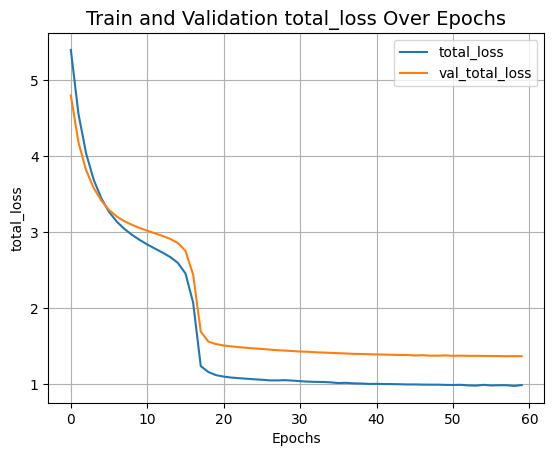

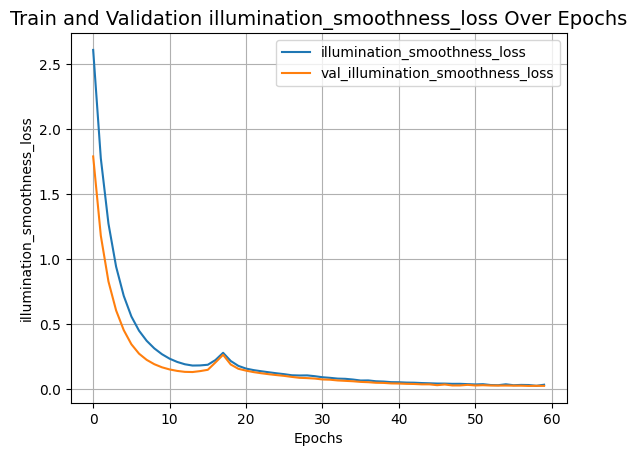

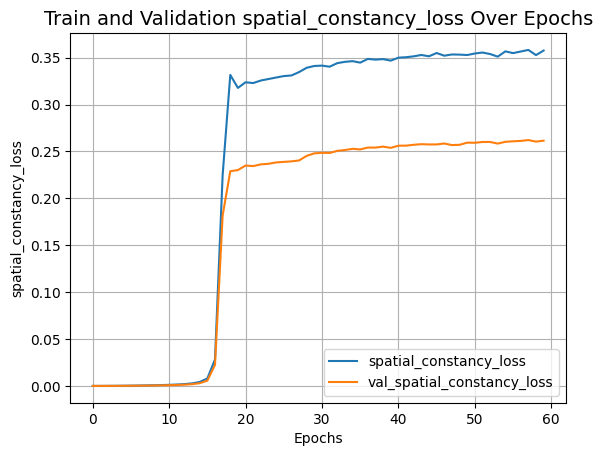

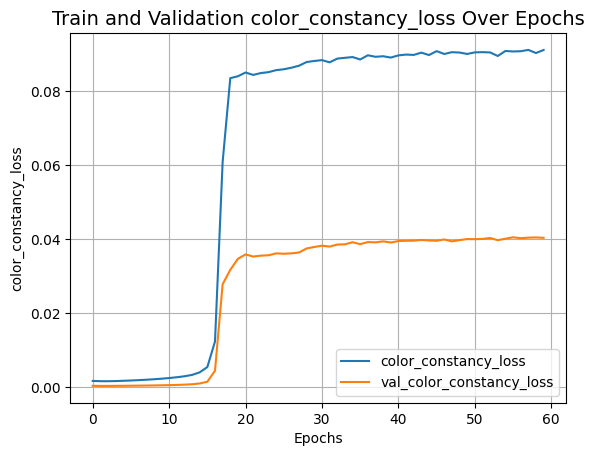

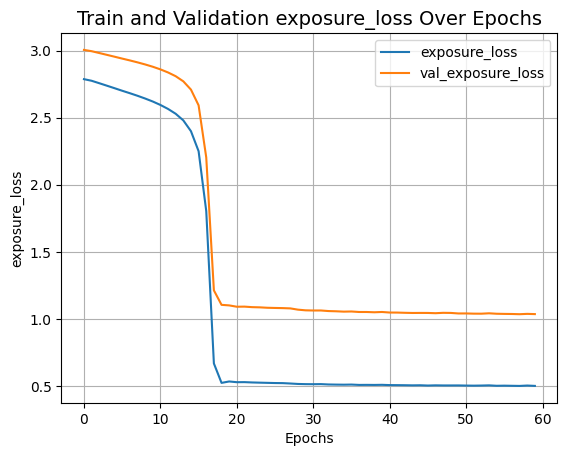

In [20]:
zero_dce_model = ZeroDCE()
zero_dce_model.compile(learning_rate=1e-4)
history = zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=60)


def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

In [21]:
def perform_inference(original_image):
    image_array = keras.preprocessing.image.img_to_array(original_image)
    image_array = image_array.astype("float32") / 255.0
    image_array = np.expand_dims(image_array, axis=0)
    output_image = zero_dce_model(image_array)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

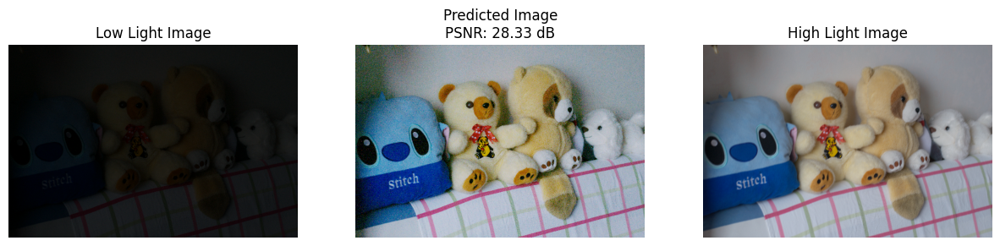

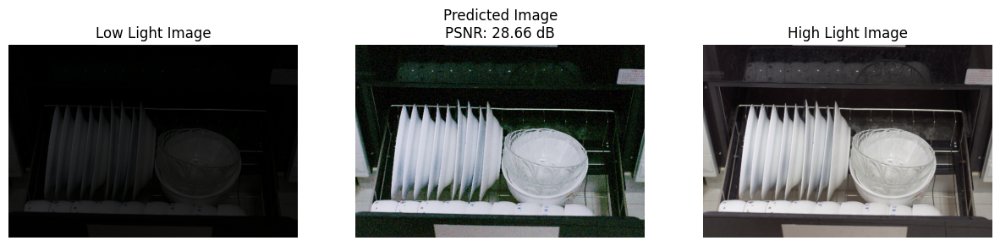

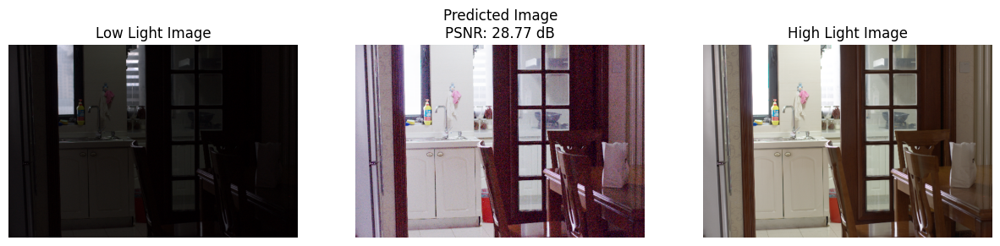

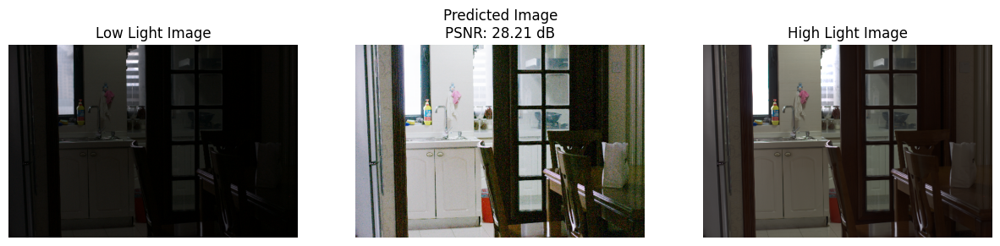

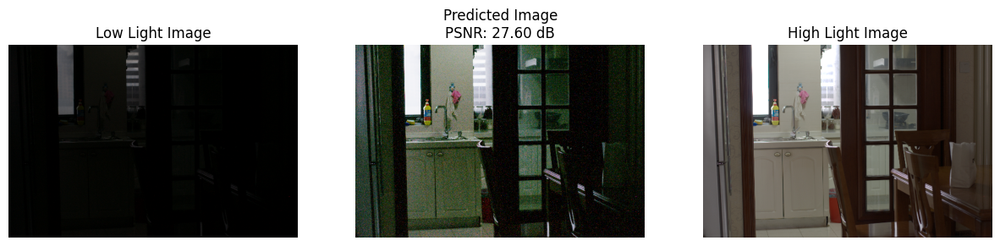

...

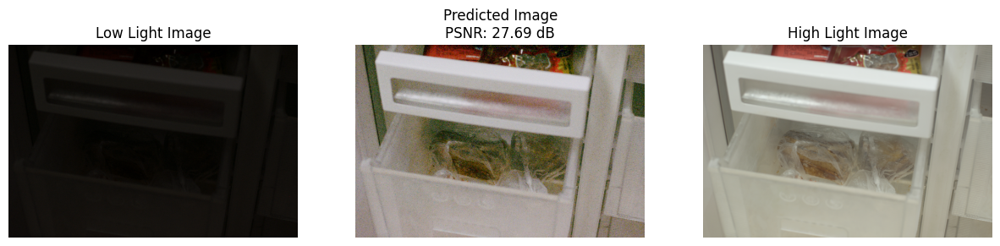

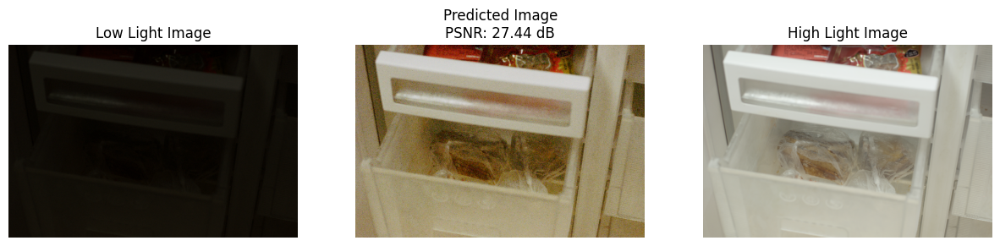

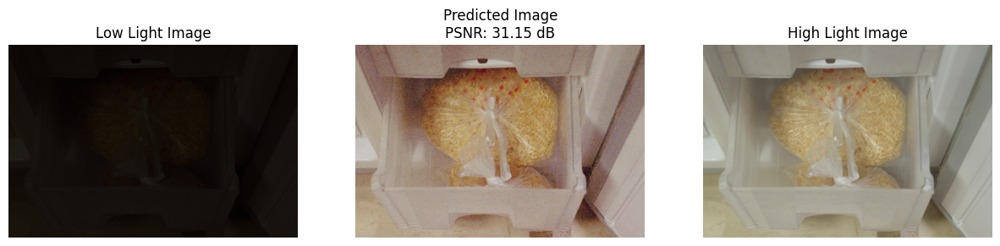

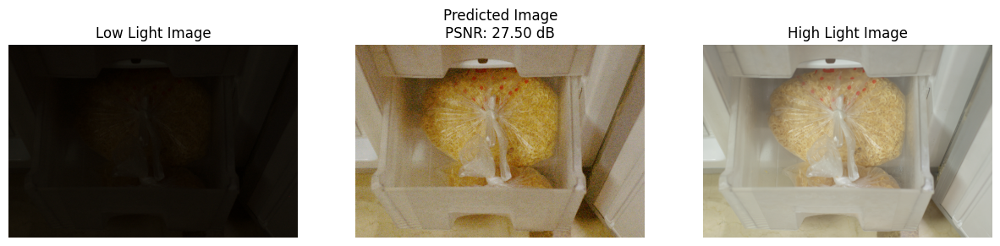

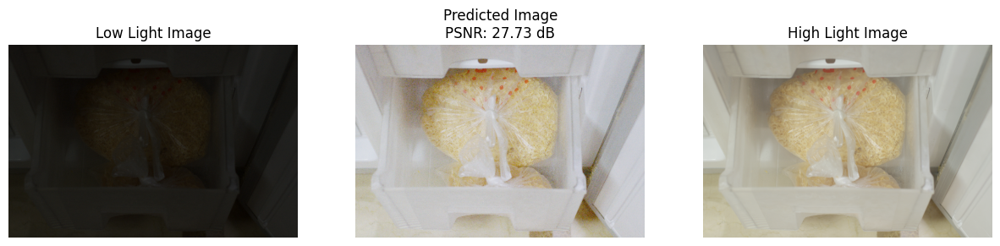

Average PSNR: 28.21 dB


In [23]:
first_30_images = test_low_light_images[:30]
first_30_high_light_images = high_light_images[:30]

def calculate_mse(imageA, imageB):
    # Ensure the images have the same size
    assert imageA.shape == imageB.shape, "Images must have the same dimensions"

    # Compute the Mean Squared Error (MSE)
    mse = np.mean((imageA - imageB) ** 2)
    return mse

def calculate_psnr(imageA, imageB):
    mse = calculate_mse(imageA, imageB)
    if mse == 0:
        return float('inf')
    MAX_I = 255.0
    psnr = 20 * np.log10(MAX_I / np.sqrt(mse))
    return psnr

# Function to display images
def display_images(original_image, enhanced_image, high_light_image, psnr_value):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(original_image)
    axs[0].set_title("Low Light Image")
    axs[0].axis('off')

    axs[1].imshow(enhanced_image)
    axs[1].set_title(f"Predicted Image\nPSNR: {psnr_value:.2f} dB")
    axs[1].axis('off')

    axs[2].imshow(high_light_image)
    axs[2].set_title("High Light Image")
    axs[2].axis('off')

    plt.show()

# List to store PSNR values
psnr_values = []

# Process and display each image
for val_image_file, high_light_file in zip(first_30_images, first_30_high_light_images):
    original_image = Image.open(val_image_file)
    enhanced_image = perform_inference(original_image)
    high_light_image = Image.open(high_light_file)

    # Convert images to displayable format
    original_image_np = np.array(original_image)
    enhanced_image_np = np.array(enhanced_image)
    high_light_image_np = np.array(high_light_image)

    # If the images are RGB, convert them to grayscale for PSNR calculation
    if original_image_np.ndim == 3:
        original_image_np = cv2.cvtColor(original_image_np, cv2.COLOR_RGB2GRAY)
    if enhanced_image_np.ndim == 3:
        enhanced_image_np = cv2.cvtColor(enhanced_image_np, cv2.COLOR_RGB2GRAY)
    if high_light_image_np.ndim == 3:
        high_light_image_np = cv2.cvtColor(high_light_image_np, cv2.COLOR_RGB2GRAY)

    # Calculate PSNR between enhanced image and high light image
    psnr_value = calculate_psnr(high_light_image_np, enhanced_image_np)
    psnr_values.append(psnr_value)

    # Display the images along with PSNR value
    display_images(np.array(original_image), np.array(enhanced_image), np.array(high_light_image), psnr_value)

# Calculate and display the average PSNR value
average_psnr = np.mean(psnr_values)
print(f"Average PSNR: {average_psnr:.2f} dB")